In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from itertools import product
import pyarrow.parquet as pq

import torch
from sklearn.cluster import KMeans
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from sklearn.metrics import pairwise_distances_argmin_min
from scipy.spatial.distance import cdist

from sklearn.decomposition import PCA
import torch.nn.functional as F

from torch import nn
from torch.utils.data import TensorDataset, DataLoader
from torch.optim import Adam
from itertools import cycle


In [3]:
from google.colab import data_table
from vega_datasets import data

data_table.enable_dataframe_formatter()

In [4]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/BA/data')

In [54]:
import pickle


file_path = 'df_trained_embeddings.pkl'

# Open the file in binary read mode
with open(file_path, 'rb') as file:
    # Load the content of the file into a Python object
    data = pickle.load(file)

In [ ]:
# data.to_parquet('data.parquet')

# Visualization

In [ ]:
data.columns

Index(['Municipality', 'Country', 'E-Mail', 'status', 'id', 'basic_embedding',
       'homepage2vec_embedding', 'homepage2vec_withvisual_embedding',
       'header_embedding', 'markuplm_embedding_base',
       'markuplm_embedding_large', 'visual_embedding', 'Municipality Website',
       'url', 'basic_and_header_embedding', 'url_domain', 'data_source',
       'url_domain_no_lang', 'top_domain', 'handlabeled', 'y', 'dataset',
       'markuplm_embedding_base_trained_predictions',
       'markuplm_embedding_base_trained_embedding',
       'markuplm_embedding_large_trained_predictions',
       'markuplm_embedding_large_trained_embedding',
       'visual_embedding_trained_predictions',
       'visual_embedding_trained_embedding',
       'homepage2vec_embedding_trained_predictions',
       'homepage2vec_embedding_trained_embedding',
       'homepage2vec_withvisual_embedding_trained_predictions',
       'homepage2vec_withvisual_embedding_trained_embedding',
       'header_embedding_trained_pr

In [ ]:
#  data = {'Name': ['Shuaib', 'Musa', 'Rhayor', 'Shebanky', 'Yusuf', 'Everlasting', 'Mary'],

# 'Age': [20, 21, 22, 23, 24, 25, 26],

# 'Country': ['NGN', 'NGN', 'NGN', 'NGN', 'UK', 'NGN', 'NGN']

# }

# df = pd.DataFrame(data)

# # Now, display the dataframe

# df

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)
pd.options.display.max_rows = 10
data

Municipality   Country                         E-Mail                                                                          status     id                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   basic_embedding                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  

In [ ]:
data.top_domain

1528    Municipality
736     Municipality
5118    Municipality
6222    Municipality
3173    Municipality
            ...     
1262    Municipality
4891    Municipality
2012    Municipality
1129    Municipality
2031       wikipedia
Name: top_domain, Length: 6396, dtype: object

In [ ]:
# Now you can use the 'data' variable, which contains your Python object
data.visual_embedding

1528    [tensor(0.3238), tensor(0.9263), tensor(0.5119...
736     [tensor(0.2343), tensor(1.3913), tensor(0.2570...
5118    [tensor(0.0577), tensor(0.9685), tensor(0.8255...
6222    [tensor(1.1377), tensor(2.0707), tensor(0.5477...
3173    [tensor(0.7037), tensor(0.9935), tensor(1.5719...
                              ...                        
1262    [tensor(0.1047), tensor(1.1802), tensor(0.2375...
4891    [tensor(0.6783), tensor(1.6946), tensor(0.2440...
2012    [tensor(0.1207), tensor(1.3143), tensor(1.0199...
1129    [tensor(0.3445), tensor(1.2020), tensor(0.6930...
2031    [tensor(0.0911), tensor(0.9295), tensor(0.2477...
Name: visual_embedding, Length: 6396, dtype: object

In [ ]:
# Assuming df is your DataFrame
df = data.copy(deep=True)

In [ ]:
for col in df.columns:
    if any(isinstance(x, (list, np.ndarray)) for x in df[col]):
        print(f"Column '{col}' contains mutable types.")

Column 'basic_embedding' contains mutable types.
Column 'homepage2vec_embedding' contains mutable types.
Column 'homepage2vec_withvisual_embedding' contains mutable types.
Column 'header_embedding' contains mutable types.
Column 'markuplm_embedding_base' contains mutable types.
Column 'markuplm_embedding_large' contains mutable types.
Column 'basic_and_header_embedding' contains mutable types.
Column 'markuplm_embedding_base_trained_embedding' contains mutable types.
Column 'markuplm_embedding_large_trained_embedding' contains mutable types.
Column 'visual_embedding_trained_embedding' contains mutable types.
Column 'homepage2vec_embedding_trained_embedding' contains mutable types.
Column 'homepage2vec_withvisual_embedding_trained_embedding' contains mutable types.
Column 'header_embedding_trained_embedding' contains mutable types.


<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


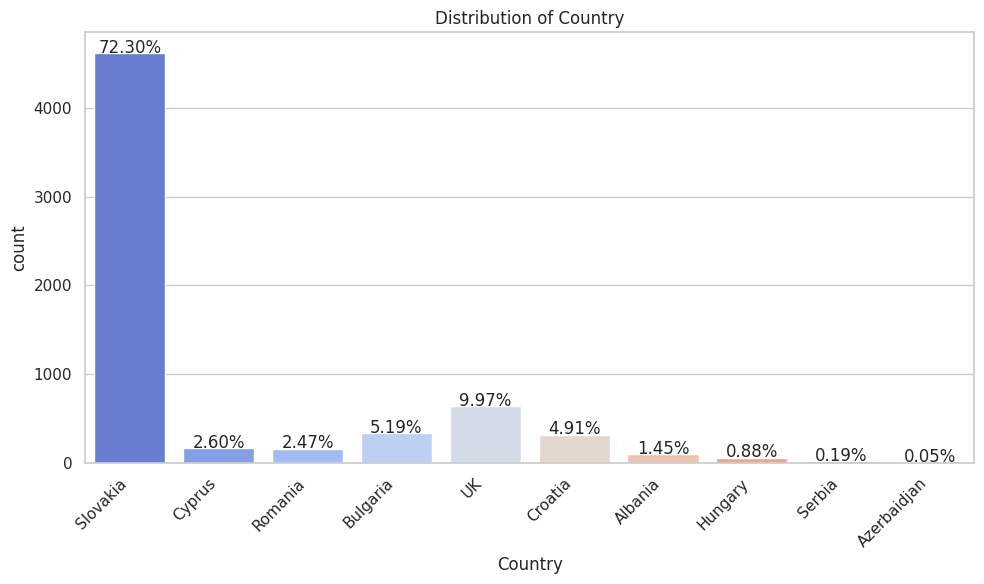

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


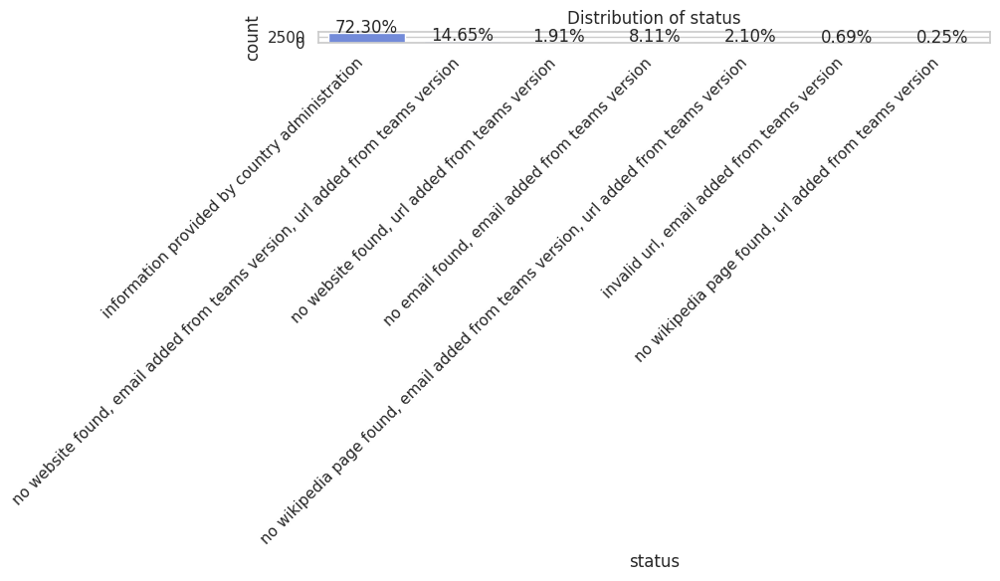

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


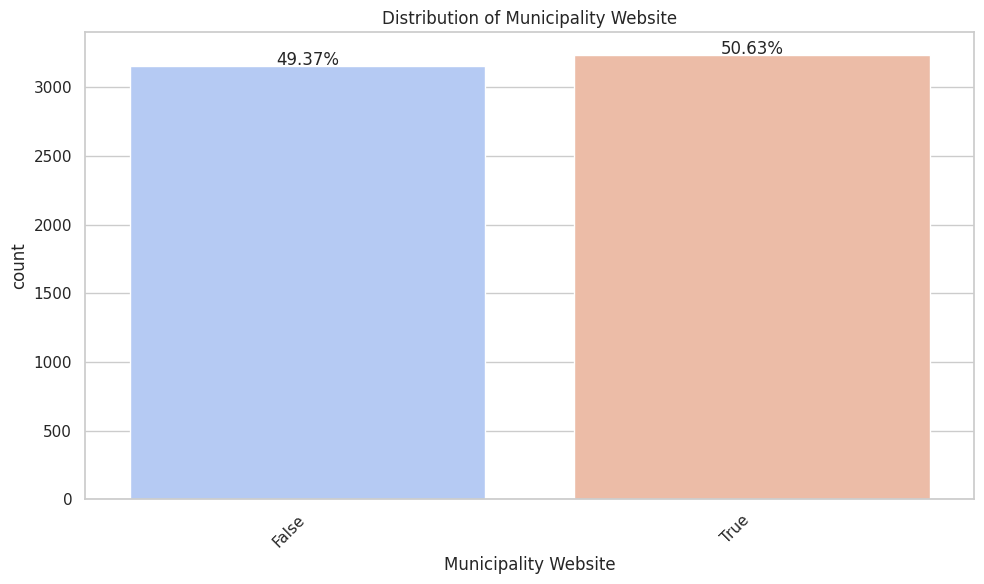

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


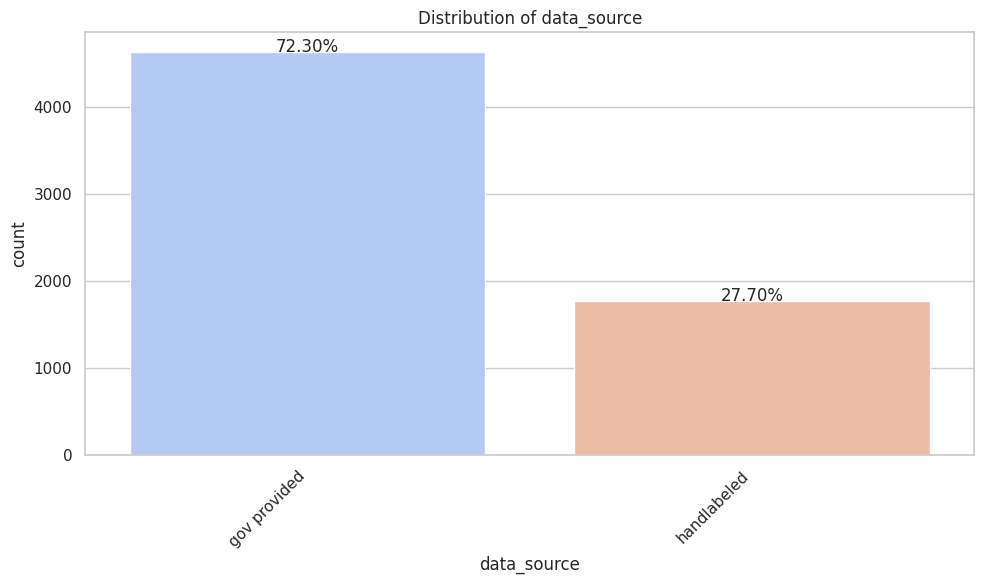

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


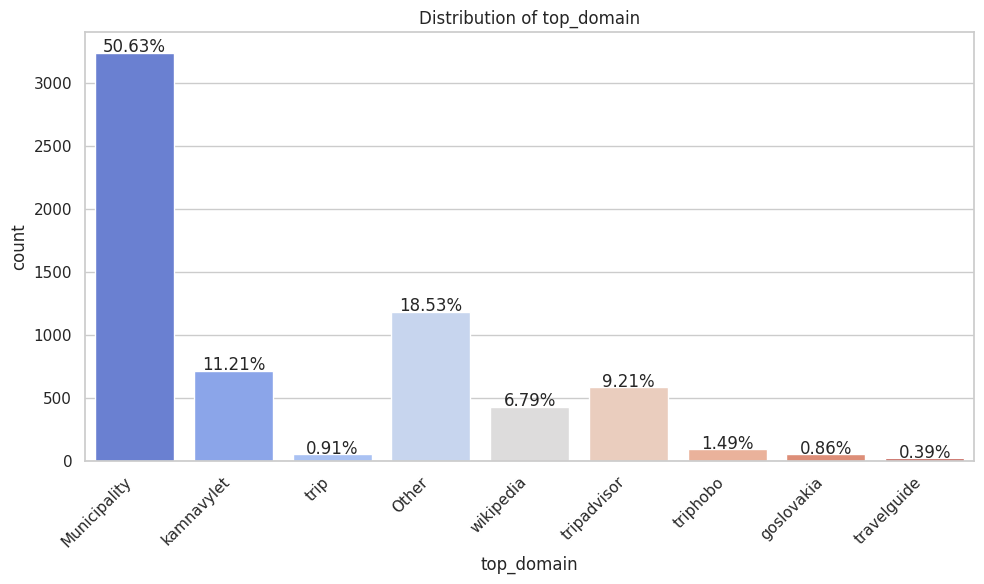

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


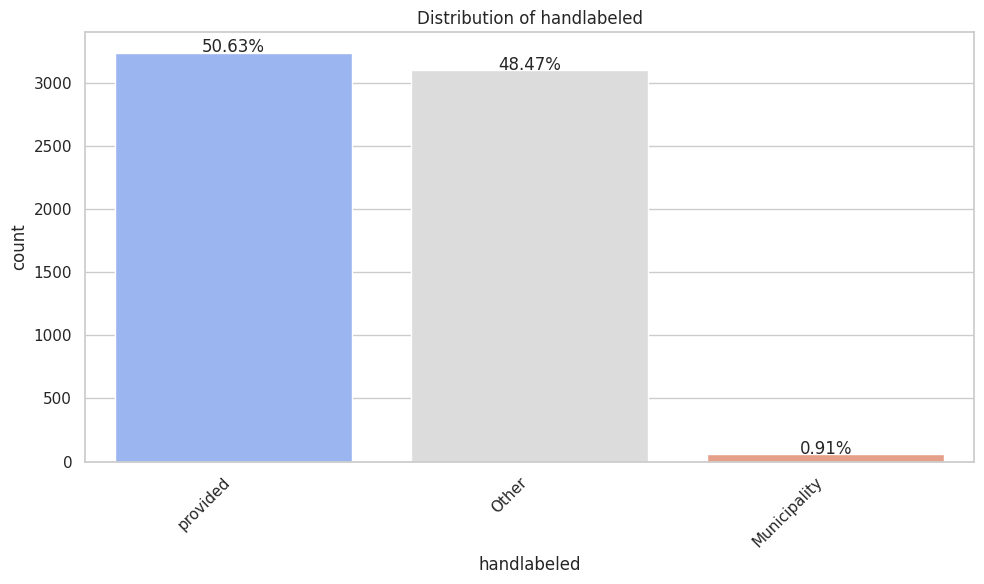

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


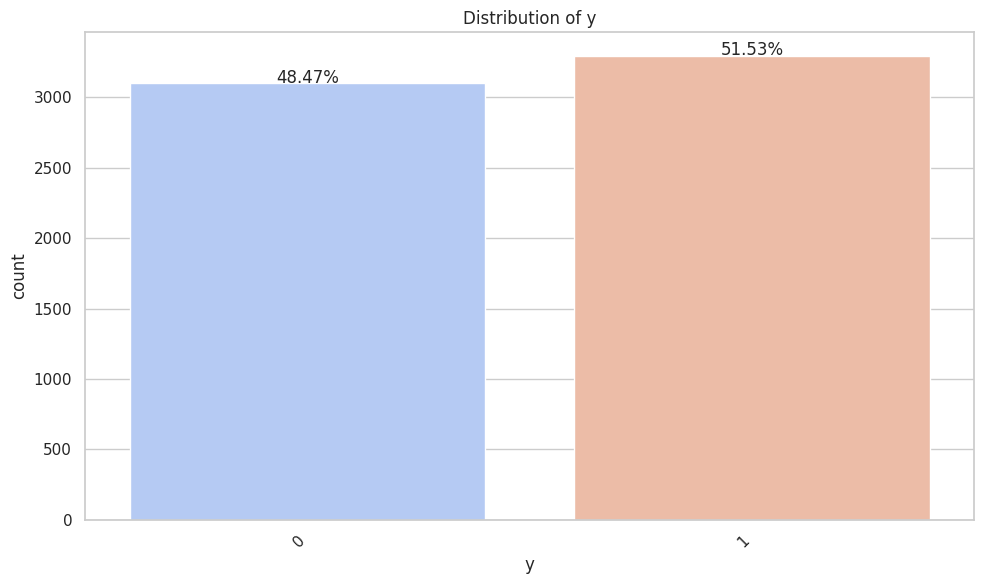

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


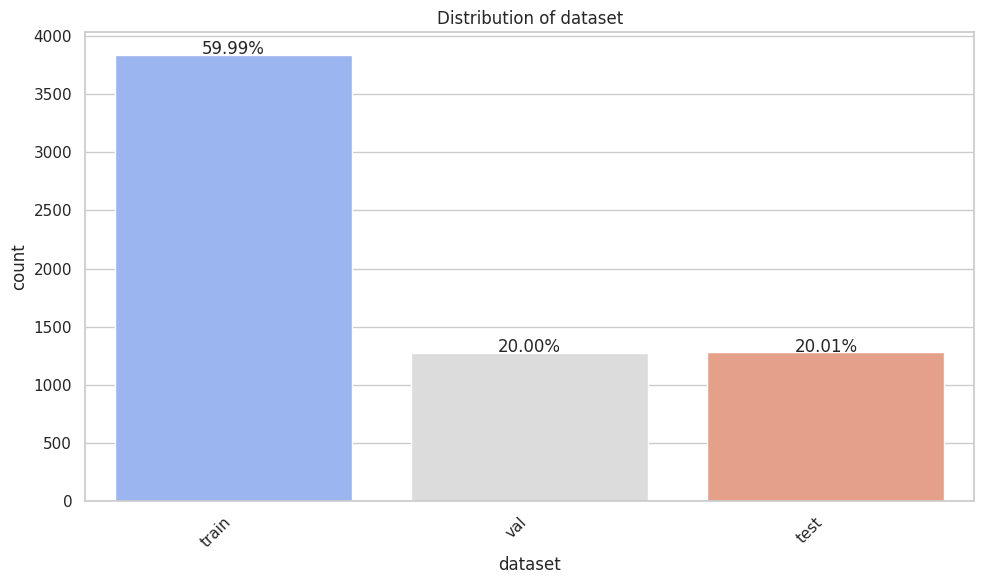

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


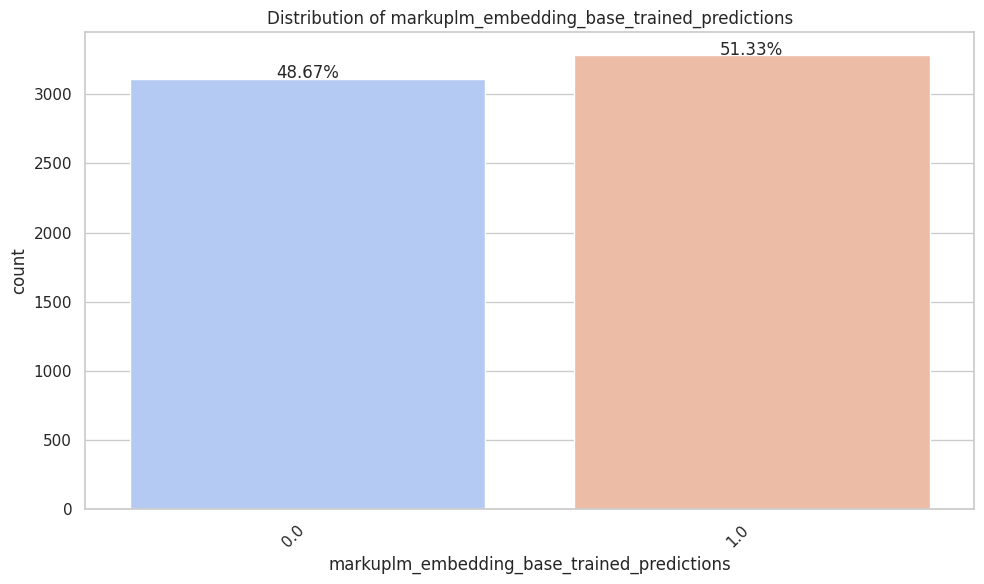

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


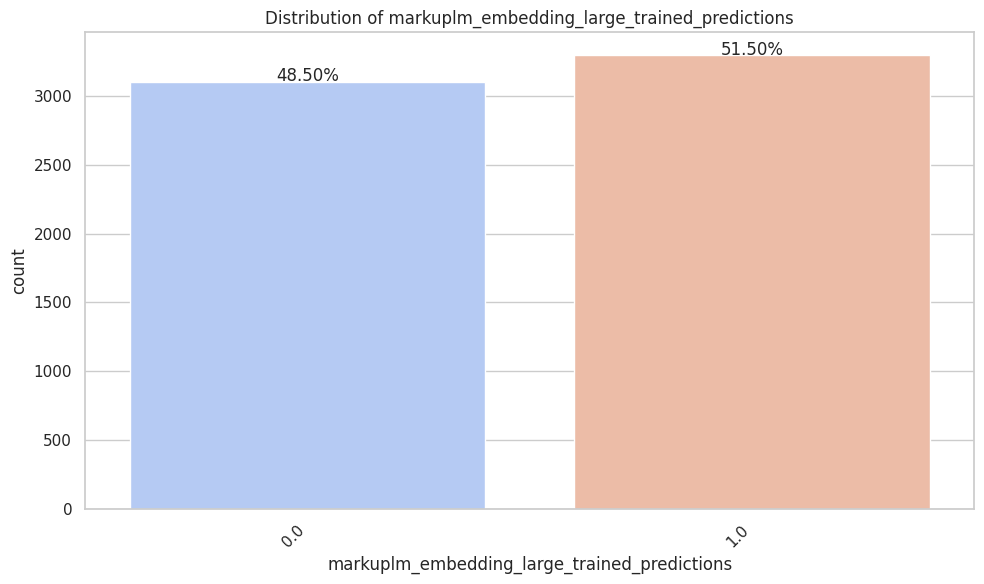

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


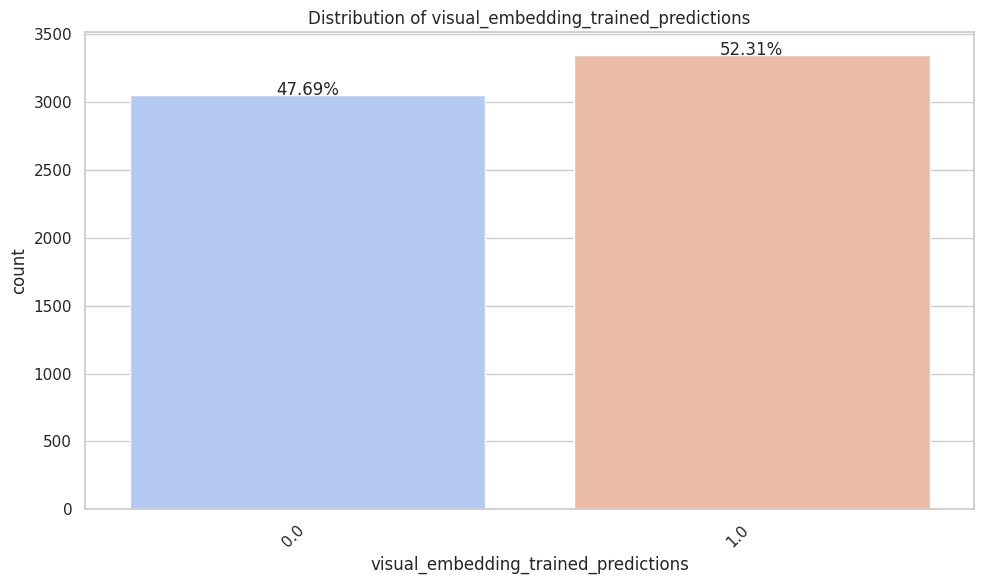

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


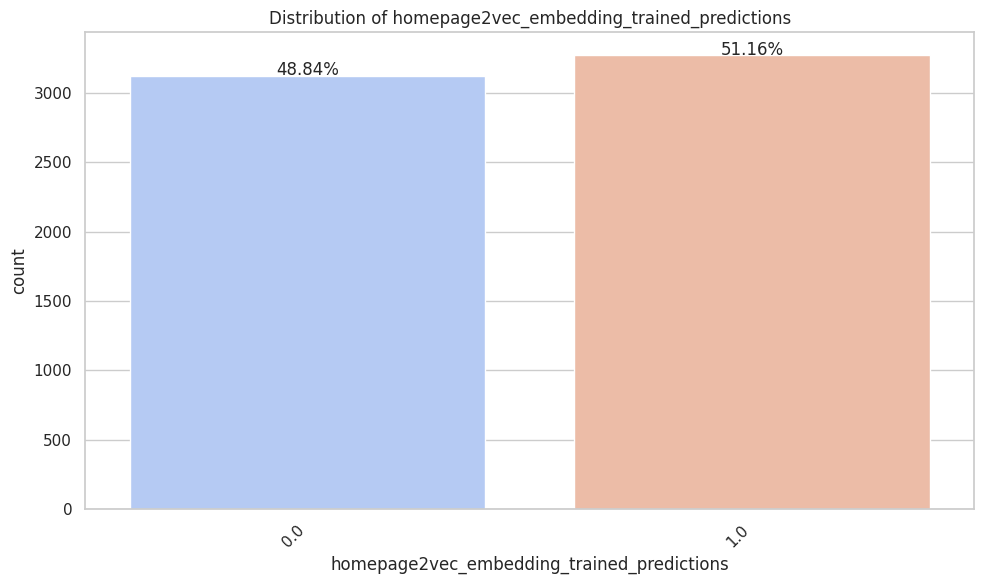

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


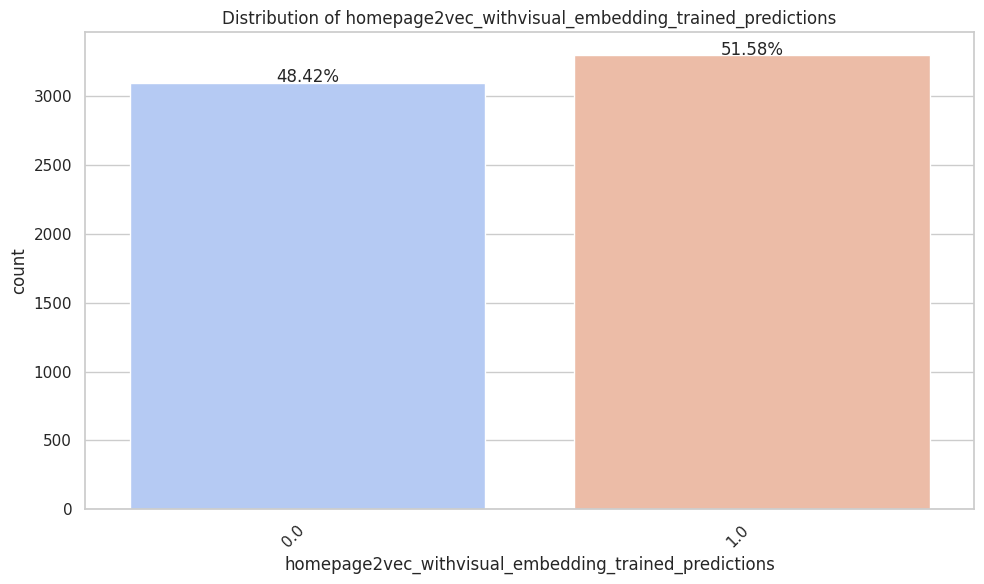

<ipython-input-27-94c3428c65ea>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=col, data=df, palette='coolwarm')


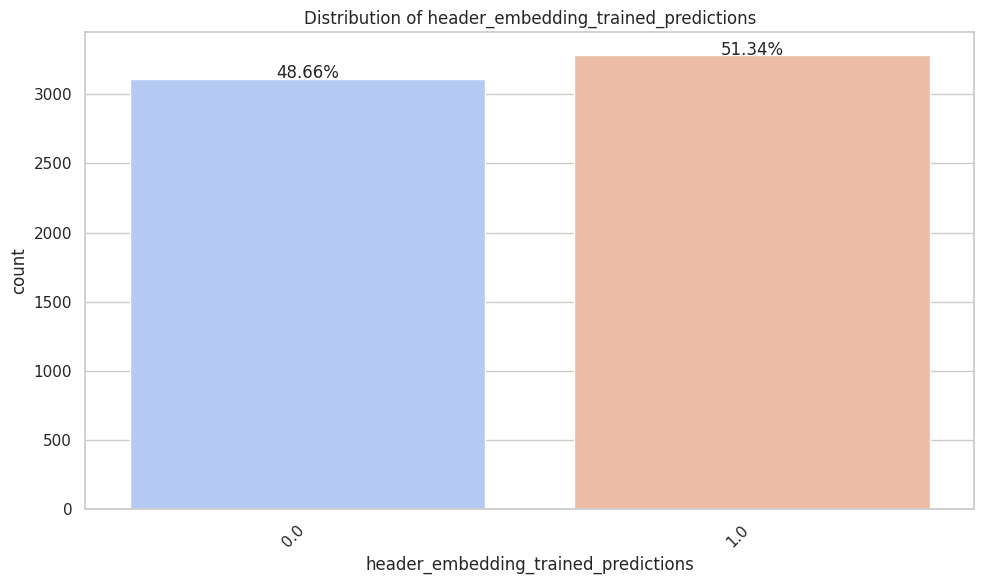

In [ ]:


# Set the style of seaborn
sns.set(style="whitegrid")

# List of columns to plot
columns_to_plot = [
    'Country', 'status', 'Municipality Website', 'data_source', 'top_domain',
    'handlabeled', 'y', 'dataset', 'markuplm_embedding_base_trained_predictions',
    'markuplm_embedding_large_trained_predictions', 'visual_embedding_trained_predictions',
    'homepage2vec_embedding_trained_predictions', 'homepage2vec_withvisual_embedding_trained_predictions',
    'header_embedding_trained_predictions'
]

# Plotting
for col in columns_to_plot:
    plt.figure(figsize=(10, 6))
    total = float(len(df))  # for calculating percentages for annotations
    ax = sns.countplot(x=col, data=df, palette='coolwarm')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha="right")

    # Add annotations
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center")

    plt.tight_layout()
    plt.show()


In [ ]:


# Exclude embedding columns from the nunique operation
exclude_columns = [
    'basic_embedding', 'homepage2vec_embedding', 'homepage2vec_withvisual_embedding',
    'header_embedding', 'markuplm_embedding_base', 'markuplm_embedding_large',
    'basic_and_header_embedding', 'markuplm_embedding_base_trained_embedding',
    'markuplm_embedding_large_trained_embedding', 'visual_embedding_trained_embedding',
    'homepage2vec_embedding_trained_embedding', 'homepage2vec_withvisual_embedding_trained_embedding',
    'header_embedding_trained_embedding','visual_embedding'
]

# 1. Number of unique values in each column
scalar_columns = df.drop(columns=exclude_columns)
unique_values_scalar = scalar_columns.nunique()
print("Number of unique values in each scalar column:")
print(unique_values_scalar.to_string())

Number of unique values in each scalar column:
Municipality                                             3991
Country                                                    10
E-Mail                                                   3149
status                                                      7
id                                                       3994
Municipality Website                                        2
url                                                      6396
url_domain                                               3957
data_source                                                 2
url_domain_no_lang                                       3880
top_domain                                                  9
handlabeled                                                 3
y                                                           2
dataset                                                     3
markuplm_embedding_base_trained_predictions                 2
markuplm_embedding_larg

In [ ]:
# 2. Number of NA values in each column
na_values = scalar_columns.isna().sum()
print("Number of NA values in each column:")
print(na_values.to_string())

Number of NA values in each column:
Municipality                                                0
Country                                                     0
E-Mail                                                   3224
status                                                      0
id                                                          0
Municipality Website                                        0
url                                                         0
url_domain                                                  0
data_source                                                 0
url_domain_no_lang                                          0
top_domain                                                  0
handlabeled                                                 0
y                                                           0
dataset                                                     0
markuplm_embedding_base_trained_predictions                 0
markuplm_embedding_large_trained_p

In [ ]:
# 3. Number of duplicate rows
duplicates = scalar_columns.duplicated().sum()
print(f"Number of duplicate rows in the DataFrame: {duplicates}")

Number of duplicate rows in the DataFrame: 0


t_SNE for the following embedding:  markuplm_embedding_base_trained_embedding
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.002s...
[t-SNE] Computed neighbors for 6396 samples in 0.561s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.194978
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.372208
[t-SNE] KL divergence after 300 iterations: 1.844206


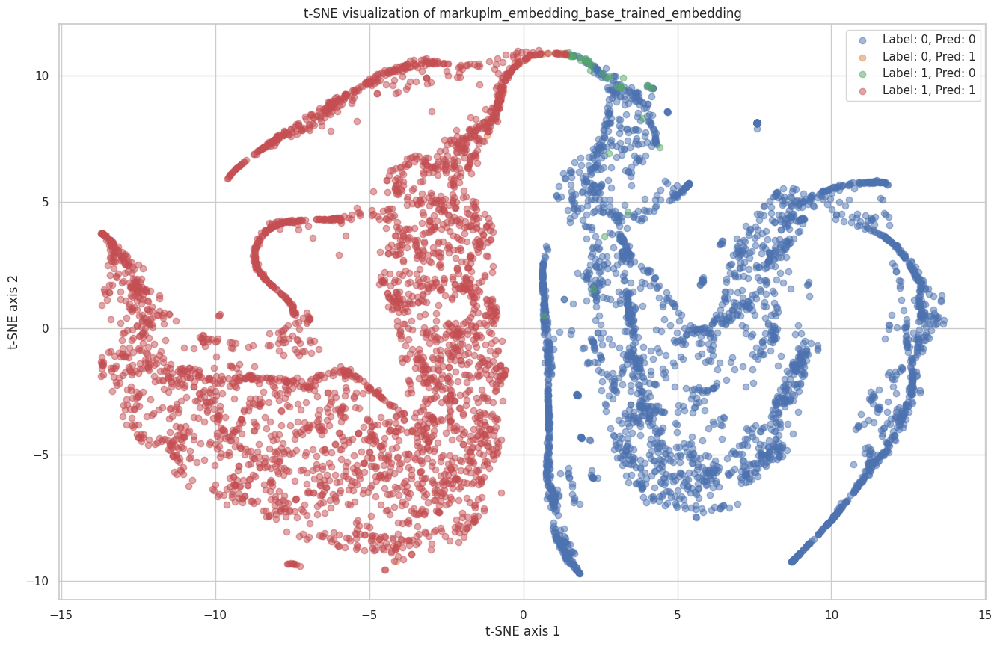

t_SNE for the following embedding:  markuplm_embedding_large_trained_embedding
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.001s...
[t-SNE] Computed neighbors for 6396 samples in 0.592s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.249148
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.362465
[t-SNE] KL divergence after 300 iterations: 1.891591


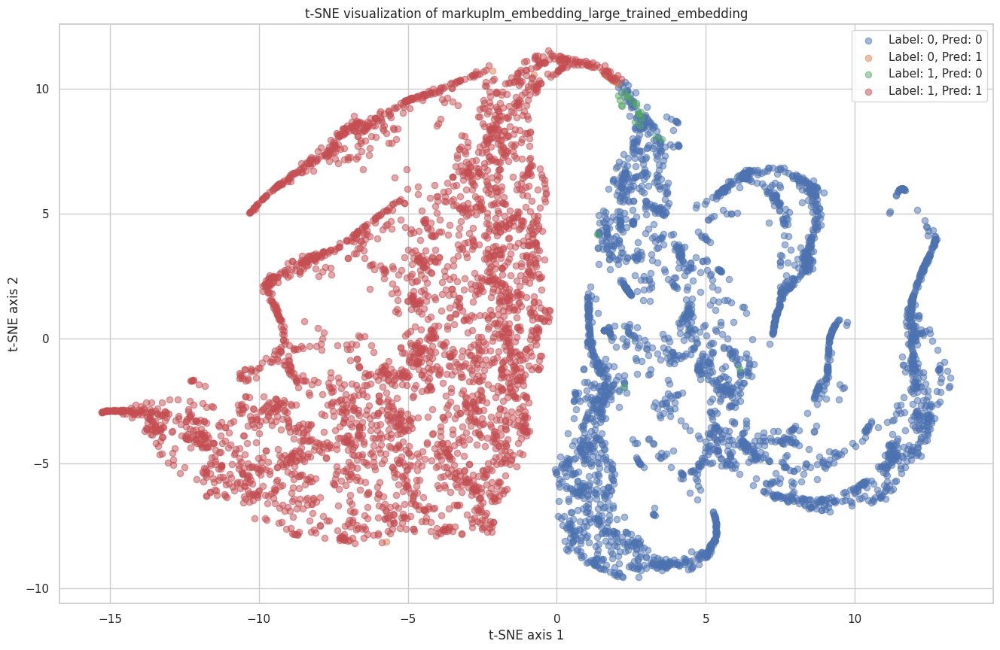

t_SNE for the following embedding:  visual_embedding_trained_embedding
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.001s...
[t-SNE] Computed neighbors for 6396 samples in 0.596s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.139565
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.458214
[t-SNE] KL divergence after 300 iterations: 2.332427


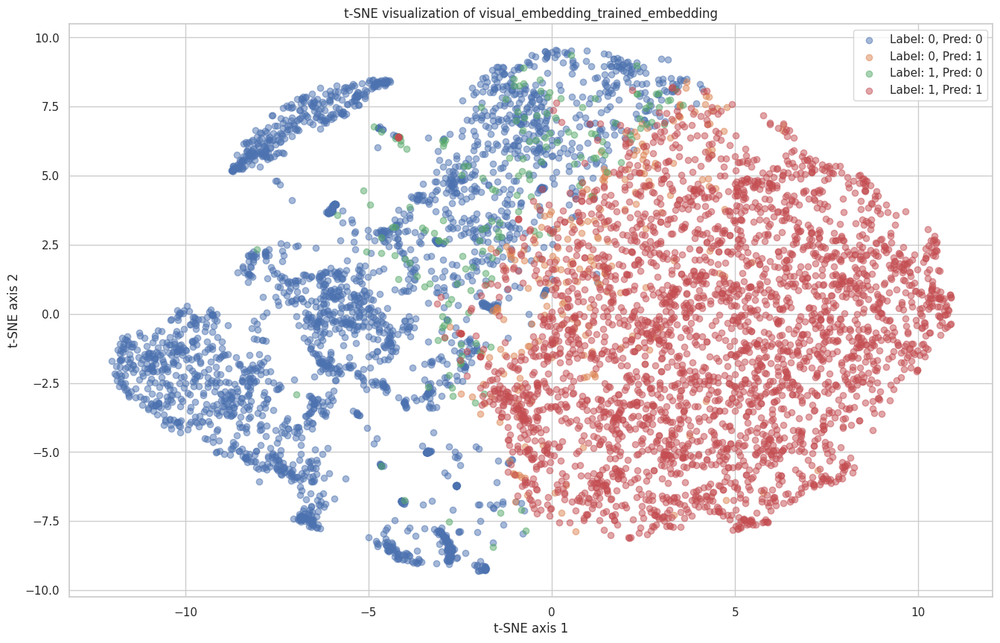

t_SNE for the following embedding:  homepage2vec_embedding_trained_embedding
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.001s...
[t-SNE] Computed neighbors for 6396 samples in 0.564s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 1.395784
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.427368
[t-SNE] KL divergence after 300 iterations: 2.488215


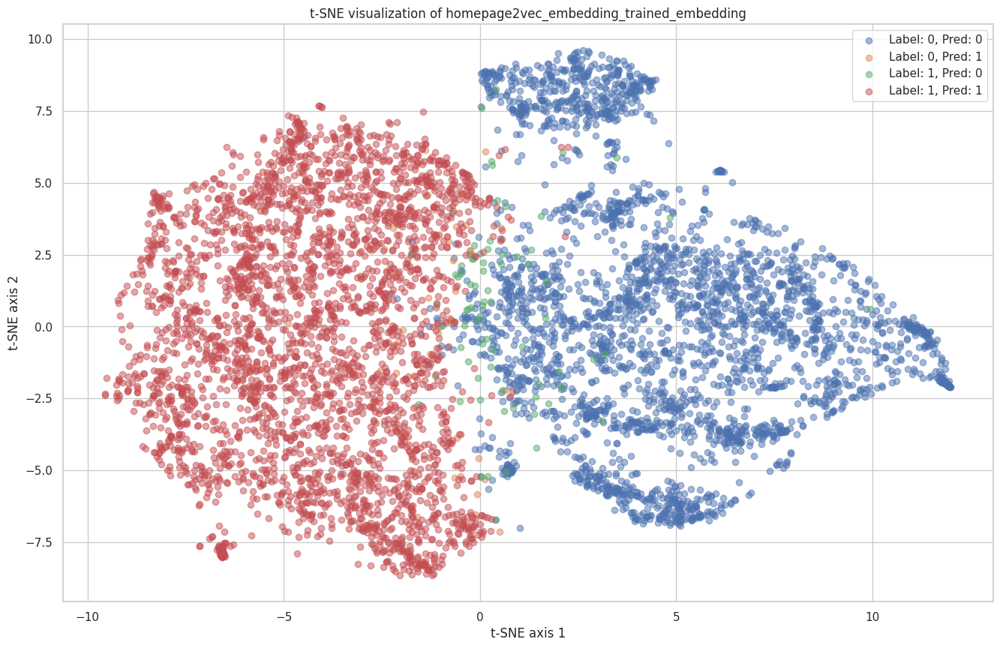

t_SNE for the following embedding:  homepage2vec_withvisual_embedding_trained_embedding
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.004s...
[t-SNE] Computed neighbors for 6396 samples in 0.792s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 2.051324
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.662987
[t-SNE] KL divergence after 300 iterations: 2.605782


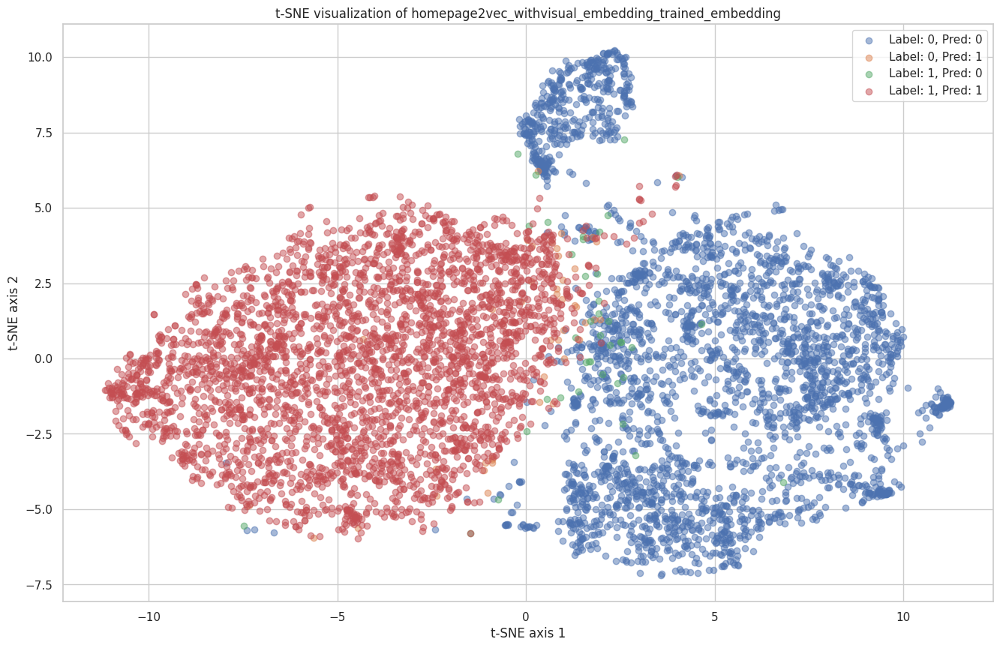

t_SNE for the following embedding:  header_embedding_trained_embedding
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.004s...
[t-SNE] Computed neighbors for 6396 samples in 0.591s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.580685
[t-SNE] KL divergence after 300 iterations: 1.712638


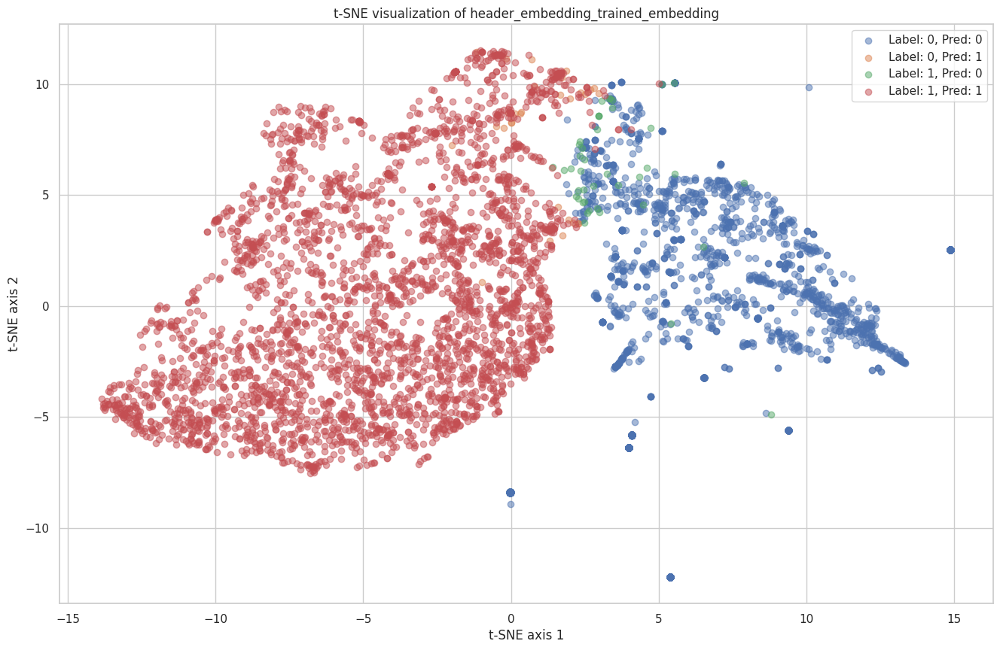

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Define your DataFrame 'df' here
# df = pd.read_csv('your_file.csv')

fine_tuned_embedding_columns = [
    'markuplm_embedding_base_trained_embedding',
    'markuplm_embedding_large_trained_embedding',
    'visual_embedding_trained_embedding',
    'homepage2vec_embedding_trained_embedding',
    'homepage2vec_withvisual_embedding_trained_embedding',
    'header_embedding_trained_embedding'
]

prediction_of_fine_tuned_embedding_columns = [
    'markuplm_embedding_base_trained_predictions',
    'markuplm_embedding_large_trained_predictions',
    'visual_embedding_trained_predictions',
    'homepage2vec_embedding_trained_predictions',
    'homepage2vec_withvisual_embedding_trained_predictions',
    'header_embedding_trained_predictions'
]

original_label = 'y'

# Iterate over embedding columns and their corresponding prediction columns
for embedding_column, prediction_column in zip(fine_tuned_embedding_columns, prediction_of_fine_tuned_embedding_columns):
    print("t_SNE for the following embedding: ",embedding_column)
    embeddings = np.array(df[embedding_column].tolist())

    # PCA for dimensionality reduction
    pca = PCA(n_components=50)  # Reduce to 50 dimensions for faster t-SNE computation
    pca_result = pca.fit_transform(embeddings)

    # t-SNE for visualization
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_results = tsne.fit_transform(pca_result)

    # Prepare plot
    plt.figure(figsize=(16,10))
    for label in [0, 1]:
        for pred in [0, 1]:
            # Filter data points by actual label and predicted label
            idx = (df[original_label] == label) & (df[prediction_column] == pred)
            plt.scatter(tsne_results[idx, 0], tsne_results[idx, 1], label=f'Label: {label}, Pred: {pred}', alpha=0.5)

    plt.title(f't-SNE visualization of {embedding_column}')
    plt.xlabel('t-SNE axis 1')
    plt.ylabel('t-SNE axis 2')
    plt.legend()
    plt.show()


t_SNE for the following embedding:  markuplm_embedding_base_trained_embedding
Accuracy: 0.991400875547217, Precision: 0.9936034115138592, Recall: 0.9896844660194175, F1-Score: 0.9916400668794649
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.002s...
[t-SNE] Computed neighbors for 6396 samples in 0.562s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.194899
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.366096
[t-SNE] KL divergence after 300 iterations: 1.843105


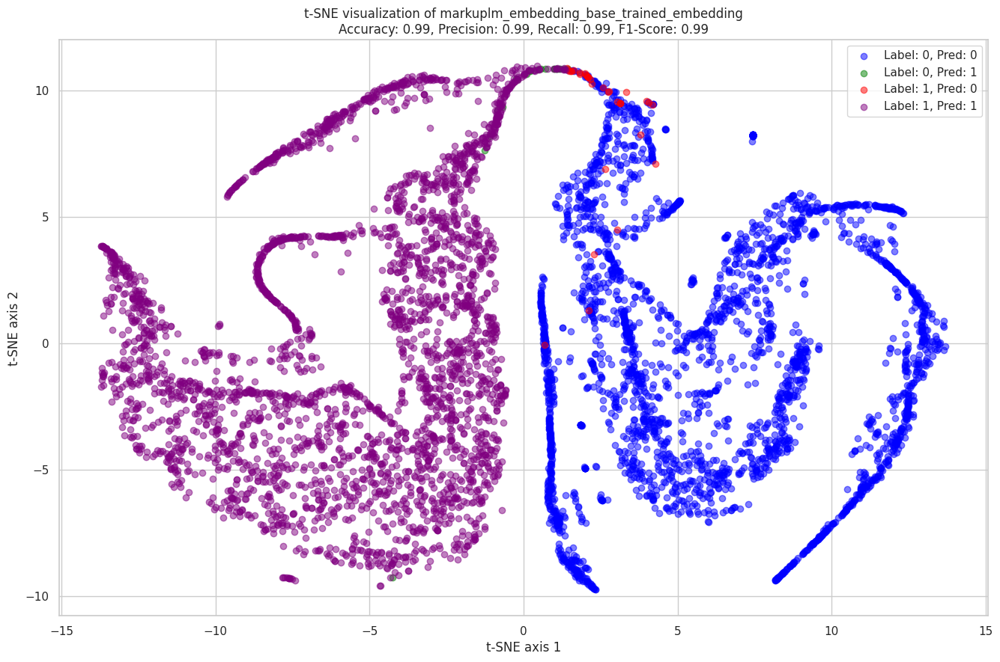

t_SNE for the following embedding:  markuplm_embedding_large_trained_embedding
Accuracy: 0.9931207004377736, Precision: 0.9936247723132969, Recall: 0.9930218446601942, F1-Score: 0.9933232169954477
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.002s...
[t-SNE] Computed neighbors for 6396 samples in 0.550s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.249068
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.375320
[t-SNE] KL divergence after 300 iterations: 1.891245


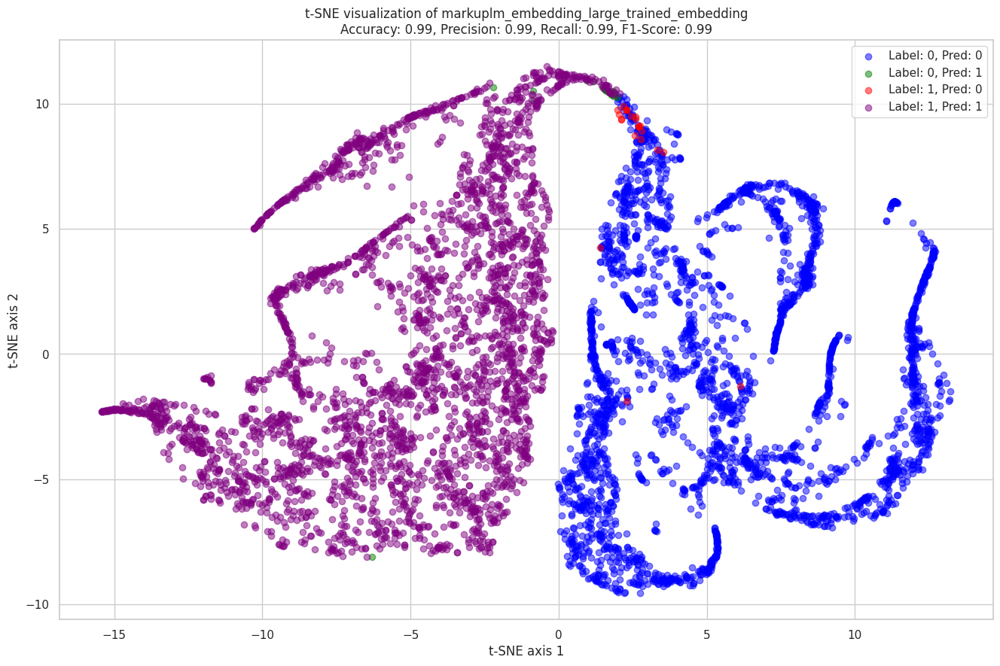

t_SNE for the following embedding:  visual_embedding_trained_embedding
Accuracy: 0.9371482176360225, Precision: 0.9324566646742379, Recall: 0.9466019417475728, F1-Score: 0.939476061427281
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.002s...
[t-SNE] Computed neighbors for 6396 samples in 0.580s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.139542
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.457840
[t-SNE] KL divergence after 300 iterations: 2.332287


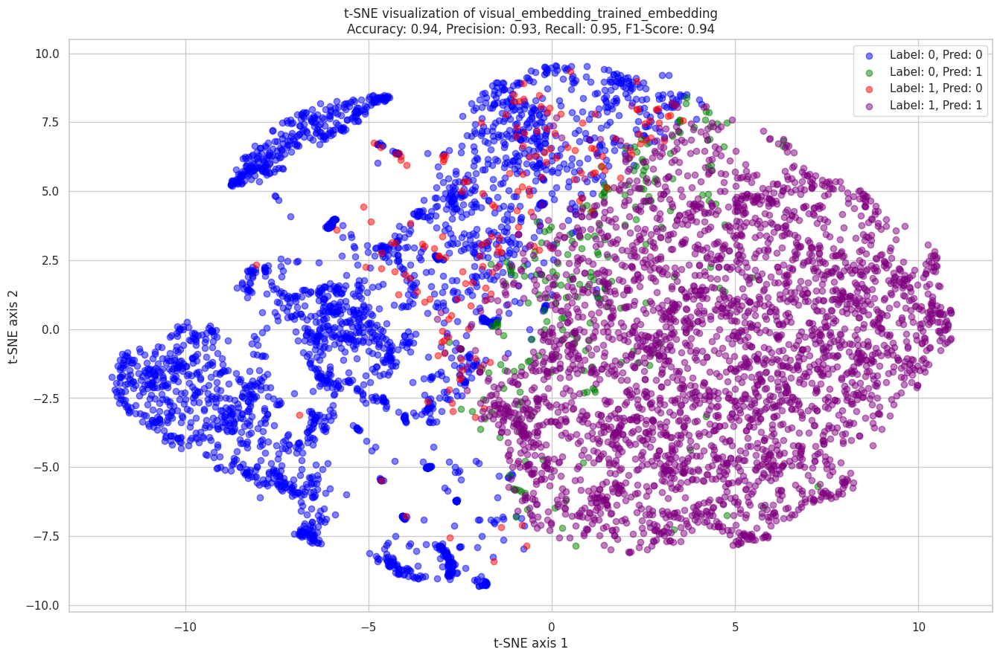

t_SNE for the following embedding:  homepage2vec_embedding_trained_embedding
Accuracy: 0.9796747967479674, Precision: 0.98380195599022, Recall: 0.9766383495145631, F1-Score: 0.9802070645554203
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.005s...
[t-SNE] Computed neighbors for 6396 samples in 0.575s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 1.395783
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.427193
[t-SNE] KL divergence after 300 iterations: 2.488242


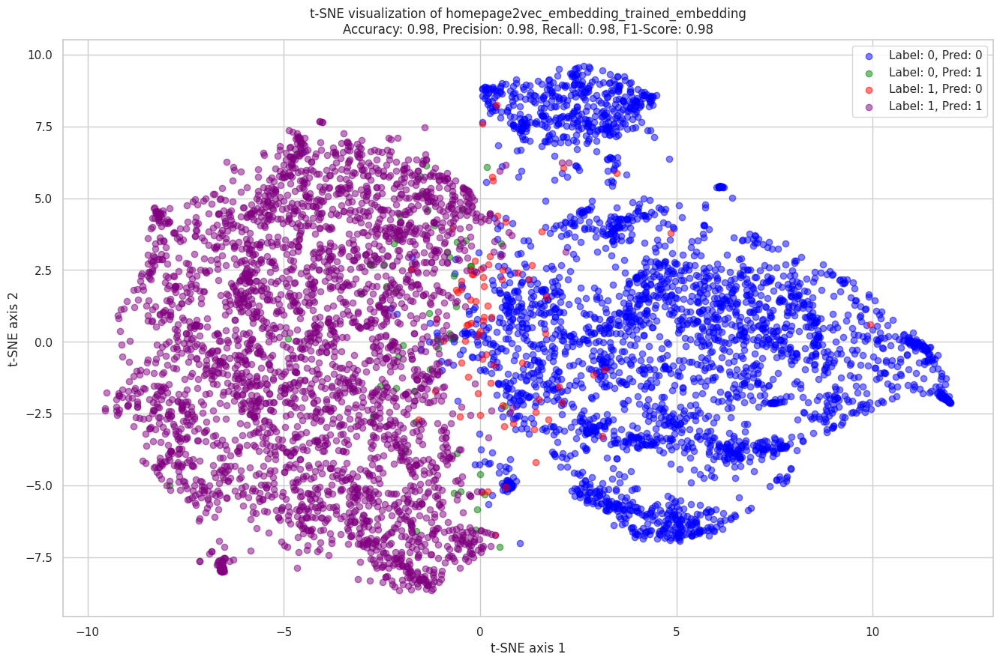

t_SNE for the following embedding:  homepage2vec_withvisual_embedding_trained_embedding
Accuracy: 0.9870231394621638, Precision: 0.9869657471961201, Recall: 0.9878640776699029, F1-Score: 0.9874147081122062
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.002s...
[t-SNE] Computed neighbors for 6396 samples in 0.571s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 2.051325
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.662643
[t-SNE] KL divergence after 300 iterations: 2.605788


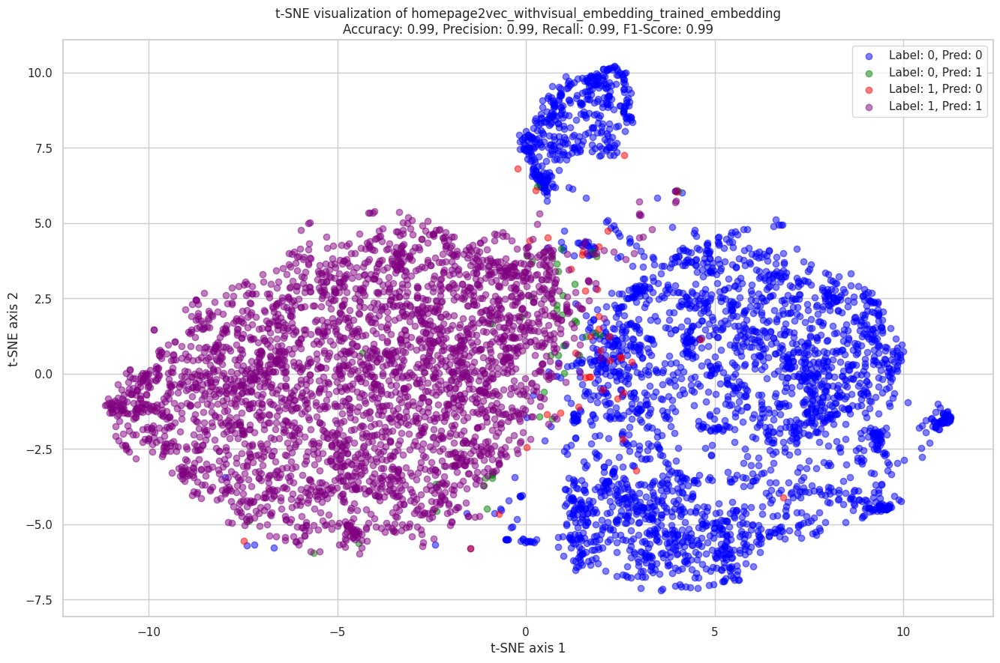

t_SNE for the following embedding:  header_embedding_trained_embedding
Accuracy: 0.9884302689180738, Precision: 0.9905602923264312, Recall: 0.9869538834951457, F1-Score: 0.9887537993920973
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 6396 samples in 0.002s...
[t-SNE] Computed neighbors for 6396 samples in 0.946s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6396
[t-SNE] Computed conditional probabilities for sample 2000 / 6396
[t-SNE] Computed conditional probabilities for sample 3000 / 6396
[t-SNE] Computed conditional probabilities for sample 4000 / 6396
[t-SNE] Computed conditional probabilities for sample 5000 / 6396
[t-SNE] Computed conditional probabilities for sample 6000 / 6396
[t-SNE] Computed conditional probabilities for sample 6396 / 6396
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.627296
[t-SNE] KL divergence after 300 iterations: 1.522793


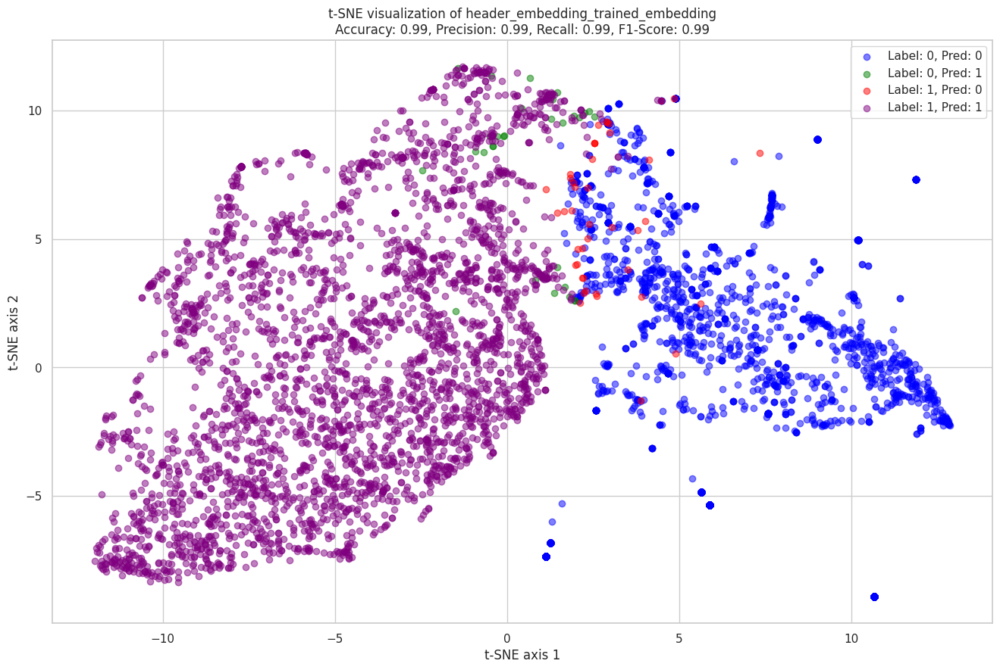

In [ ]:
fine_tuned_embedding_columns = [
    'markuplm_embedding_base_trained_embedding',
    'markuplm_embedding_large_trained_embedding',
    'visual_embedding_trained_embedding',
    'homepage2vec_embedding_trained_embedding',
    'homepage2vec_withvisual_embedding_trained_embedding',
    'header_embedding_trained_embedding'
]

prediction_of_fine_tuned_embedding_columns = [
    'markuplm_embedding_base_trained_predictions',
    'markuplm_embedding_large_trained_predictions',
    'visual_embedding_trained_predictions',
    'homepage2vec_embedding_trained_predictions',
    'homepage2vec_withvisual_embedding_trained_predictions',
    'header_embedding_trained_predictions'
]

original_label = 'y'

# Colors for each combination of label and prediction
colors = ['blue', 'green', 'red', 'purple']

# Iterate over embedding columns and their corresponding prediction columns
for embedding_column, prediction_column in zip(fine_tuned_embedding_columns, prediction_of_fine_tuned_embedding_columns):
    print("t_SNE for the following embedding: ", embedding_column)
    embeddings = np.array(df[embedding_column].tolist())

    # Calculate metrics
    y_true = df[original_label]
    y_pred = df[prediction_column]
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1-Score: {f1}")

    # PCA for dimensionality reduction
    pca = PCA(n_components=50)  # Reduce to 50 dimensions for faster t-SNE computation
    pca_result = pca.fit_transform(embeddings)

    # t-SNE for visualization
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_results = tsne.fit_transform(pca_result)

    # Prepare plot
    plt.figure(figsize=(16,10))
    legend_handles = []
    for i, (label, pred) in enumerate(product([0, 1], repeat=2)):
        idx = (df[original_label] == label) & (df[prediction_column] == pred)
        scatter = plt.scatter(tsne_results[idx, 0], tsne_results[idx, 1], color=colors[i], label=f'Label: {label}, Pred: {pred}', alpha=0.5)
        legend_handles.append(scatter)

    plt.title(f't-SNE visualization of {embedding_column}\nAccuracy: {accuracy:.2f}, Precision: {precision:.2f}, Recall: {recall:.2f}, F1-Score: {f1:.2f}')
    plt.xlabel('t-SNE axis 1')
    plt.ylabel('t-SNE axis 2')
    plt.legend(handles=legend_handles)
    plt.show()

In [ ]:

# # Additional suggestions:
# # - Removing duplicates
# df = df.drop_duplicates()

# # - Filling or dropping NA values depending on the column importance
# df.fillna({'some_column': 'default_value'}, inplace=True)
# df.dropna(subset=['important_column'], inplace=True)

# # - Convert columns to appropriate data types (if necessary)
# df['id'] = df['id'].astype(str)

# # - Extracting domain from URL for analysis
# df['extracted_domain'] = df['url'].apply(lambda x: x.split('/')[2] if pd.notna(x) else x)

# # - Analyzing or visualizing embeddings (e.g., using dimensionality reduction techniques like PCA or t-SNE for visualization)


## USL dataset

In [ ]:
# Assume df is your DataFrame
usl_dataset = pd.DataFrame({
    'website_embedding_tensors': data['markuplm_embedding_large_trained_embedding'],
    'label': data['y']
})


In [ ]:
usl_dataset.head(2)

,website_embedding_tensors,label
1528,"[-1.1581026315689087, 2.245634078979492, -0.59...",1
736,"[-1.1362833976745605, 2.529743194580078, -0.48...",1


In [ ]:
usl_dataset.info

<bound method DataFrame.info of                               website_embedding_tensors  label
1528  [-1.1581026315689087, 2.245634078979492, -0.59...      1
736   [-1.1362833976745605, 2.529743194580078, -0.48...      1
5118  [-1.180051326751709, 2.5992841720581055, -0.55...      1
6222  [-1.0370652675628662, 2.3323986530303955, -0.5...      1
3173  [-0.9566311836242676, 1.4130791425704956, -0.5...      1
...                                                 ...    ...
1262  [-1.138888955116272, 2.3545172214508057, -0.61...      1
4891  [-0.9529528617858887, 2.3457980155944824, -0.5...      1
2012  [-1.1015443801879883, 2.5248026847839355, -0.5...      1
1129  [-0.9748512506484985, 1.6776505708694458, -0.5...      1
2031  [-0.8822541236877441, -0.01568615436553955, -0...      0

[6396 rows x 2 columns]>

## Clustering Model

In [55]:
class ClusteringModel(nn.Module):
    def __init__(self, nclusters=100, embedding_dim=1024, nheads=3):
        super(ClusteringModel, self).__init__()
        self.embedding_dim = embedding_dim
        self.nheads = nheads

        self.cluster_heads = nn.ModuleList([nn.Linear(embedding_dim, nclusters) for _ in range(nheads)])

    def forward(self, x):
        # Since we are directly using embeddings, there's no backbone model involved here.
        features = x
        outputs = [cluster_head(features) for cluster_head in self.cluster_heads]
        return outputs

## USL-t Pretrain Impelementation

### Loss functions

In [56]:
# Credit to PAWS: https://github.com/facebookresearch/suncet/blob/main/src/losses.py
def sharpen(p, T):  # T: sharpen temperature
    sharp_p = p ** (1. / T)
    sharp_p = sharp_p / torch.sum(sharp_p, dim=1, keepdim=True)
    return sharp_p


class OursLossLocal(nn.Module):
    def __init__(self, num_classes, num_heads, momentum=None, adjustment_weight=None, sharpen_temperature=None):
        super(OursLossLocal, self).__init__()
        self.momentum = momentum

        self.adjustment_weight = adjustment_weight

        self.num_heads = num_heads

        self.register_buffer("prob_ema", torch.ones(
            (num_heads, num_classes)) / num_classes)

        self.sharpen_temperature = sharpen_temperature

    def forward(self, head_id, anchors, neighbors):
        # This is ours v2 with multi_headed prob_ema support
        """
        input:
            - anchors: logits for anchor images w/ shape [b, num_classes]
            - neighbors: logits for neighbor images w/ shape [b, num_classes]

        output:
            - Loss
        """
        # Softmax
        b, n = anchors.size()
        head_prob_ema = self.prob_ema[head_id]
        neighbors_adjusted = neighbors - self.adjustment_weight * \
            torch.log(head_prob_ema).view((1, -1))

        anchors_prob = F.softmax(anchors, dim=1)
        positives_prob = F.softmax(neighbors_adjusted, dim=1)
        log_anchors_prob = F.log_softmax(anchors, dim=1)

        positives_original_prob = F.softmax(neighbors, dim=1)
        head_prob_ema = head_prob_ema * self.momentum + \
            positives_original_prob.detach().mean(dim=0) * (1 - self.momentum)
        head_prob_ema = head_prob_ema / head_prob_ema.sum()

        self.prob_ema[head_id] = head_prob_ema

        consistency_loss = F.kl_div(log_anchors_prob, sharpen(
            positives_prob.detach(), T=self.sharpen_temperature), reduction="batchmean")

        # Total loss
        total_loss = consistency_loss

        return total_loss


class OursLossGlobal(nn.Module):
    # From ConfidenceBasedCE
    def __init__(self, threshold, reweight, num_classes, num_heads, mean_outside_mask=False, use_count_ema=False, momentum=0., data_len=None, reweight_renorm=False):
        super(OursLossGlobal, self).__init__()
        self.threshold = threshold
        self.reweight = reweight
        # setting reweight_renorm to True ignores reweight
        self.reweight_renorm = reweight_renorm

        if self.reweight_renorm:
            print("Reweight renorm is enabled")
        else:
            print("Reweight renorm is not enabled")

        self.mean_outside_mask = mean_outside_mask
        self.use_count_ema = use_count_ema

        self.num_classes = num_classes
        self.num_heads = num_heads

        self.momentum = momentum

        if use_count_ema:
            print("Data length:", data_len)
            self.data_len = data_len
            self.register_buffer("count_ema", torch.ones(
                (num_heads, num_classes)) / num_classes)
        self.register_buffer("num_counts", torch.zeros(1, dtype=torch.long))

    # Equivalent to: https://pytorch.org/docs/stable/generated/torch.nn.KLDivLoss.html
    # With one-hot target
    def kl_div_loss(self, input, target, mask, weight, mean_outside_mask):
        if torch.all(mask == 0):
            # Return 0 as loss if nothing is in mask
            return torch.tensor(0., device=input.device)

        b = input.shape[0]

        # Select samples that pass the confidence threshold
        input = torch.masked_select(
            input, mask.view(b, 1)).view((-1, input.shape[1]))
        target = torch.masked_select(target, mask)

        log_prob = -F.log_softmax(input, dim=1)
        if weight is not None:
            # Weighted KL divergence
            log_prob = log_prob * weight.view((1, -1))
        loss = torch.gather(log_prob, 1, target.view((-1, 1))).view(-1)

        if mean_outside_mask:
            # Normalize by a constant (batch size)
            return loss.sum(dim=0) / b
        else:
            if weight is not None:
                # Take care of weighted sum
                weight_sum = weight[target].sum(dim=0)
                return (loss / weight_sum).sum(dim=0)
            else:
                return loss.mean(dim=0)

    def forward(self, head_id, anchors_weak, anchors_strong):
        """
        Loss function during self-labeling

        input: logits for original samples and for its strong augmentations
        output: cross entropy
        """
        # Retrieve target and mask based on weakly augmentated anchors

        weak_anchors_prob = F.softmax(anchors_weak, dim=1)

        max_prob, target = torch.max(weak_anchors_prob, dim=1)
        mask = max_prob > self.threshold
        b, c = weak_anchors_prob.size()
        target_masked = torch.masked_select(target, mask.squeeze())
        n = target_masked.size(0)

        if self.use_count_ema:
            with torch.no_grad():
                head_count_ema = self.count_ema[head_id]

                # Normalized and adjusted with data_len
                count_in_batch = torch.bincount(
                    target_masked, minlength=c) / n * self.data_len
                head_count_ema = head_count_ema * self.momentum + \
                    count_in_batch * (1 - self.momentum)
                self.count_ema[head_id] = head_count_ema

        if head_id == 0:
            self.num_counts += 1

        # Class balancing weights
        # This is also used for debug purpose

        # reweight_renorm is equivalent to reweight when mean_outside_mask is False
        if self.reweight_renorm:
            idx, counts = torch.unique(target_masked, return_counts=True)
            # if self.use_count_ema:
            #     print("WARNING: count EMA used with class balancing")
            freq = float(n) / len(idx) / counts.float()
            weight = torch.ones(c).cuda()
            weight[idx] = freq
        elif self.reweight:
            idx, counts = torch.unique(target_masked, return_counts=True)
            if self.use_count_ema:
                print("WARNING: count EMA used with class balancing")
            freq = 1/(counts.float()/n)
            weight = torch.ones(c).cuda()
            weight[idx] = freq
        else:
            weight = None

        # Loss

        loss = self.kl_div_loss(input=anchors_strong, target=target, mask=mask,
                                weight=weight, mean_outside_mask=self.mean_outside_mask)

        if head_id == 0 and self.num_counts % 200 == 1:
            with torch.no_grad():
                idx, counts = torch.unique(target_masked, return_counts=True)
            if self.use_count_ema:
                print("use_count_ema max: {:.3f}, min: {:.3f}, median: {:.3f}, mean: {:.3f}".format(head_count_ema.max().item(),
                                                                                                      head_count_ema.min().item(), torch.median(head_count_ema).item(), head_count_ema.mean().item()))
            print("weak_anchors_prob, mean across batch (from weak anchor of global loss): {}".format(
                weak_anchors_prob.detach().mean(dim=0)))
            print("Mask: {} / {} ({:.2f}%)".format(mask.sum(),
                                                     mask.shape[0], mask.sum() * 100. / mask.shape[0]))
            print("idx: {}, counts: {}".format(idx, counts))

            if True:  # Verbose: print max confidence of each class
                m = torch.zeros((self.num_classes,))
                for i in range(self.num_classes):
                    v = max_prob[target == i]
                    if len(v):
                        m[i] = v.max()

                print("Max of each cluster: {}".format(m))

        return loss


### Training Loop

In [57]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from torch.optim import Adam

def usl_t_pretrain(embeddings,num_heads=3, n_clusters=100, n_epochs=10, batch_size=64, learning_rate=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Convert embeddings to PyTorch tensors
    embeddings_tensor = torch.tensor(embeddings, dtype=torch.float).to(device)

    # Create a TensorDataset and DataLoader without labels
    dataset = TensorDataset(embeddings_tensor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Initialize your ClusteringModel
    model = ClusteringModel(nclusters=n_clusters, embedding_dim=embeddings_tensor.size(1), nheads=3).to(device)

    # Initialize the optimizer
    optimizer = Adam(model.parameters(), lr=learning_rate)

    # Define your local and global loss functions
    criterion_local = OursLossLocal(num_classes=n_clusters, num_heads=num_heads, momentum=0.1, adjustment_weight=0.1, sharpen_temperature=0.5).to(device)
    criterion_global = OursLossGlobal(threshold=0.8, reweight=True, num_classes=n_clusters, num_heads=3, mean_outside_mask=False, use_count_ema=False, momentum=0.1, data_len=len(dataset)).to(device)

    # Training loop
    for epoch in range(n_epochs):
        model.train()
        total_loss, total_local_loss, total_global_loss = 0.0, 0.0, 0.0

        for embeddings_batch in dataloader:
            embeddings_batch = embeddings_batch[0].to(device)

            # Forward pass
            outputs = model(embeddings_batch)

            local_loss_sum = torch.tensor(0.0).to(device)
            global_loss_sum = torch.tensor(0.0).to(device)
            for head_id, output in enumerate(outputs):
                # Calculate local loss
                local_loss = criterion_local(head_id=head_id, anchors=output, neighbors=output)  # Adjust according to your data
                local_loss_sum += local_loss

                # Calculate global loss
                global_loss = criterion_global(head_id=head_id, anchors_weak=output, anchors_strong=output)  # Adjust according to your data
                global_loss_sum += global_loss

            # Combine losses
            loss = local_loss_sum + global_loss_sum

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_local_loss += local_loss_sum.item()
            total_global_loss += global_loss_sum.item()

        print(f"Epoch {epoch+1}/{n_epochs}, Total Loss: {total_loss/len(dataloader)}, Local Loss: {total_local_loss/len(dataloader)}, Global Loss: {total_global_loss/len(dataloader)}")

    # Save the model
    torch.save(model.state_dict(), "clustering_model_21_03_2024.pt")


In [58]:
# Assuming 'density_reg' is a function that applies your USL method and returns selected indices
# And 'find_duplicates' is a function that finds duplicate values inside a list
train_data=data.loc[data['dataset']=='train']
val_data=data.loc[data['dataset']=='val']
test_data=data.loc[data['dataset']=='test']

embeddings = np.array(train_data['markuplm_embedding_large'].tolist())  # convert string lists to actual lists
# embeddings = np.array(train_data['markuplm_embedding_large_trained_embedding'].tolist())  # we shouldn't use the fine-tuned version, because that is cheating
labels = train_data['y'].tolist()
embeddings_predictions=train_data['markuplm_embedding_large_trained_predictions'].tolist()

In [74]:
# Hyperparameters
n_clusters=100
n_epochs=200
batch_size=64
learning_rate=0.001
num_heads=3

# Trining
pretrained_model= usl_t_pretrain(embeddings, num_heads=num_heads, n_clusters=n_clusters, n_epochs=n_epochs, batch_size=batch_size, learning_rate=learning_rate)

Reweight renorm is not enabled
weak_anchors_prob, mean across batch (from weak anchor of global loss): tensor([0.0118, 0.0124, 0.0068, 0.0111, 0.0087, 0.0078, 0.0107, 0.0070, 0.0092,
        0.0058, 0.0091, 0.0107, 0.0095, 0.0090, 0.0083, 0.0064, 0.0089, 0.0174,
        0.0063, 0.0093, 0.0136, 0.0080, 0.0058, 0.0134, 0.0111, 0.0088, 0.0075,
        0.0087, 0.0080, 0.0123, 0.0112, 0.0049, 0.0091, 0.0058, 0.0087, 0.0081,
        0.0108, 0.0074, 0.0128, 0.0077, 0.0064, 0.0072, 0.0087, 0.0083, 0.0123,
        0.0058, 0.0132, 0.0079, 0.0158, 0.0139, 0.0133, 0.0102, 0.0150, 0.0086,
        0.0062, 0.0118, 0.0074, 0.0080, 0.0097, 0.0116, 0.0091, 0.0091, 0.0071,
        0.0145, 0.0082, 0.0091, 0.0120, 0.0141, 0.0126, 0.0175, 0.0117, 0.0117,
        0.0127, 0.0124, 0.0060, 0.0096, 0.0131, 0.0078, 0.0128, 0.0073, 0.0098,
        0.0091, 0.0067, 0.0120, 0.0185, 0.0092, 0.0109, 0.0112, 0.0121, 0.0124,
        0.0058, 0.0094, 0.0088, 0.0100, 0.0150, 0.0108, 0.0131, 0.0094, 0.0077,
        0.0085], 

## USL-t Selective Labeling

In [75]:
# Assuming 'embeddings' and 'model_path' are available
# Load your pre-trained model
model_path = "clustering_model_21_03_2024.pt"  # Adjust as needed
model = ClusteringModel(nclusters=100, embedding_dim=1024, nheads=3)
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode

# Load your dataset of embeddings
# Assuming 'embeddings' is a NumPy array of shape (num_samples, embedding_dim)
embeddings_tensor = torch.tensor(embeddings, dtype=torch.float)
dataset = TensorDataset(embeddings_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=False)  # Adjust batch size as needed

def get_sample_selection_indices(dataloader, model, final_sample_num=100):
    all_probs_list = []
    for batch in dataloader:
        embeddings_batch = batch[0]
        outputs = model(embeddings_batch)
        # Compute softmax probabilities for each head
        probs = [torch.softmax(output, dim=1) for output in outputs]
        all_probs_list.append(probs)

    # Concatenate probabilities across all batches
    all_probs_list = list(zip(*all_probs_list))  # Re-arrange to group by heads
    all_probs_list = [torch.cat(probs, dim=0) for probs in all_probs_list]  # Concatenate across batches

    # Average probabilities across heads
    avg_probs = torch.stack(all_probs_list).mean(dim=0)

    # Select samples based on averaged probabilities
    _, selected_indices = torch.topk(avg_probs.max(dim=1).values, final_sample_num)

    return selected_indices.cpu().numpy()

# Get the indices of selected samples
final_sample_num = 100  # Number of samples you want to select
selected_indices = get_sample_selection_indices(dataloader, model, final_sample_num=final_sample_num)

print("Selected indices:", selected_indices)


Selected indices: [2523 2509 2510 2511 2513 2514 2516 2517 2518 2519 2520 2521 2522 2508
 2524 2525 2526 2527 2528 2493 2461 2460 2459 2458 2457 2466 2489 2488
 2477 2476 2475 2473 2472 2471 2470 2469 2468 2467 2456 2465 2464 2478
 2494 2496 2497 2500 2501 2503 2505 2506 2411 2425 2424 2423 2422 2421
 2418 2417 2416 2415 2414 2413 2412 2426 2410 2409 2408 2407 2406 2405
 2404 2403 2402 2401 2400 2439 2455 2454 2453 2451 2450 2449 2448 2447
 2446 2444 2443 2462 2438 2437 2436 2435 2434 2433 2432 2431 2430 2428
 2427 2490]


# SSL(Mix Match)

Implementing the mixmatch function involves several steps. The function must generate soft pseudo-labels for the unlabeled data, mix the labeled and pseudo-labeled data, and then output the mixed dataset for training.
In this implementation, augment_embeddings adds Gaussian noise to the embeddings, which could be seen as a form of augmentation. The

mixmatch function takes unlabeled data and applies this augmentation K times, predicting the outputs each time. These outputs are then averaged to create the pseudo-labels used for training.

In [76]:
selected_indices

array([2523, 2509, 2510, 2511, 2513, 2514, 2516, 2517, 2518, 2519, 2520,
       2521, 2522, 2508, 2524, 2525, 2526, 2527, 2528, 2493, 2461, 2460,
       2459, 2458, 2457, 2466, 2489, 2488, 2477, 2476, 2475, 2473, 2472,
       2471, 2470, 2469, 2468, 2467, 2456, 2465, 2464, 2478, 2494, 2496,
       2497, 2500, 2501, 2503, 2505, 2506, 2411, 2425, 2424, 2423, 2422,
       2421, 2418, 2417, 2416, 2415, 2414, 2413, 2412, 2426, 2410, 2409,
       2408, 2407, 2406, 2405, 2404, 2403, 2402, 2401, 2400, 2439, 2455,
       2454, 2453, 2451, 2450, 2449, 2448, 2447, 2446, 2444, 2443, 2462,
       2438, 2437, 2436, 2435, 2434, 2433, 2432, 2431, 2430, 2428, 2427,
       2490])

In [77]:
def find_duplicates(input_list):
    seen = set()
    duplicates = set()
    for item in input_list:
        if item in seen:
            duplicates.add(item)
        else:
            seen.add(item)
    return list(duplicates)
print("Duplicated inside selected Indexes: ", find_duplicates(selected_indices))

Duplicated inside selected Indexes:  []


Selected indices: [2523 2509 2510 2511 2513 2514 2516 2517 2518 2519 2520 2521 2522 2508
 2524 2525 2526 2527 2528 2493 2461 2460 2459 2458 2457 2466 2489 2488
 2477 2476 2475 2473 2472 2471 2470 2469 2468 2467 2456 2465 2464 2478
 2494 2496 2497 2500 2501 2503 2505 2506 2411 2425 2424 2423 2422 2421
 2418 2417 2416 2415 2414 2413 2412 2426 2410 2409 2408 2407 2406 2405
 2404 2403 2402 2401 2400 2439 2455 2454 2453 2451 2450 2449 2448 2447
 2446 2444 2443 2462 2438 2437 2436 2435 2434 2433 2432 2431 2430 2428
 2427 2490]


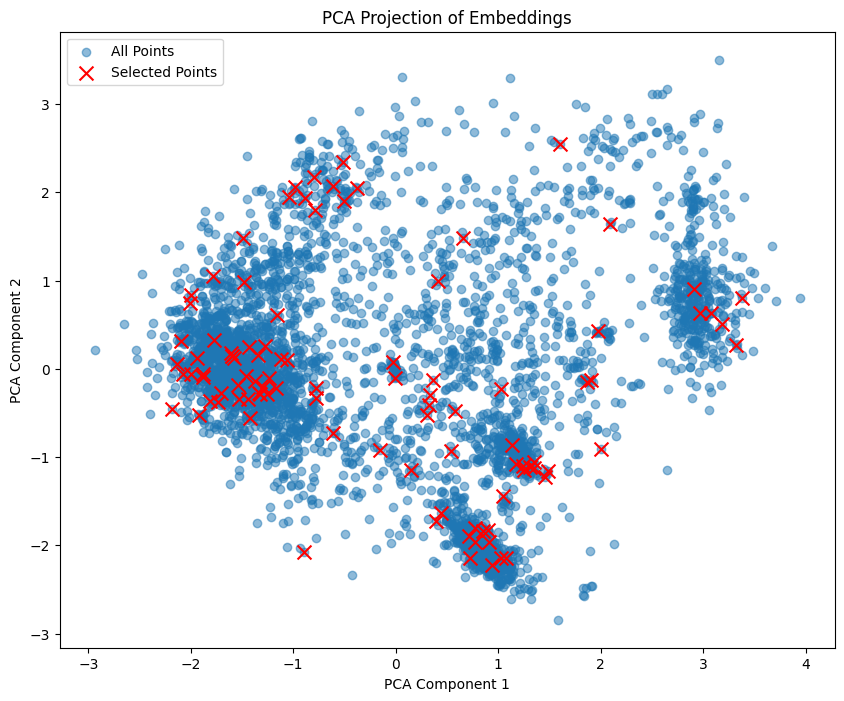

In [82]:
# Assuming 'embeddings' and 'model_path' are available
# Load your pre-trained model
model_path = "clustering_model_21_03_2024.pt"  # Adjust as needed
model = ClusteringModel(nclusters=100, embedding_dim=1024, nheads=3)
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode

# Load your dataset of embeddings
# Assuming 'embeddings' is a NumPy array of shape (num_samples, embedding_dim)
embeddings_tensor = torch.tensor(embeddings, dtype=torch.float)
dataset = TensorDataset(embeddings_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=False)  # Adjust batch size as needed


# Get the indices of selected samples
final_sample_num = 100  # Number of samples you want to select
selected_indices = get_sample_selection_indices(dataloader, model, final_sample_num=final_sample_num)

print("Selected indices:", selected_indices)

# Reduce the dimensionality for visualization with PCA
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings)

# Plot all embeddings in the background
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], alpha=0.5, label='All Points')

# Highlight the selected points
selected_points = embeddings_2d[selected_indices]
plt.scatter(selected_points[:, 0], selected_points[:, 1], color='red', marker='x', label='Selected Points', s=100)  # Increase marker size for visibility

# If you have computed cluster centers and want to plot them, do it here.
# Example (assuming 'cluster_centers_2d' contains your PCA-reduced cluster centers):
# plt.scatter(cluster_centers_2d[:, 0], cluster_centers_2d[:, 1], color='black', marker='o', label='Cluster Centers')

plt.legend()
plt.title('PCA Projection of Embeddings')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

## SSL

In [79]:
# USL-t:

# Assuming 'embeddings' and 'model_path' are available
# Load your pre-trained model
model_path = "clustering_model_21_03_2024.pt"  # Adjust as needed
model = ClusteringModel(nclusters=100, embedding_dim=1024, nheads=3)
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode


# Assuming 'density_reg' is a function that applies your USL method and returns selected indices
# And 'find_duplicates' is a function that finds duplicate values inside a list
train_data=data.loc[data['dataset']=='train']
val_data=data.loc[data['dataset']=='val']
test_data=data.loc[data['dataset']=='test']
labels_train = train_data['y'].tolist()

embeddings_train = np.array(train_data['markuplm_embedding_large'].tolist())  # convert string lists to actual lists

# Load your dataset of embeddings
# Assuming 'embeddings' is a NumPy array of shape (num_samples, embedding_dim)
embeddings_tensor = torch.tensor(embeddings_train, dtype=torch.float)
dataset = TensorDataset(embeddings_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=False)  # Adjust batch size as needed


# Get the indices of selected samples
final_sample_num = 100  # Number of samples you want to select
selected_indices = get_sample_selection_indices(dataloader, model, final_sample_num=final_sample_num)
print("Selected indices:", selected_indices)
print("Duplicated inside selected Indexes: ", find_duplicates(selected_indices))

Selected indices: [2523 2509 2510 2511 2513 2514 2516 2517 2518 2519 2520 2521 2522 2508
 2524 2525 2526 2527 2528 2493 2461 2460 2459 2458 2457 2466 2489 2488
 2477 2476 2475 2473 2472 2471 2470 2469 2468 2467 2456 2465 2464 2478
 2494 2496 2497 2500 2501 2503 2505 2506 2411 2425 2424 2423 2422 2421
 2418 2417 2416 2415 2414 2413 2412 2426 2410 2409 2408 2407 2406 2405
 2404 2403 2402 2401 2400 2439 2455 2454 2453 2451 2450 2449 2448 2447
 2446 2444 2443 2462 2438 2437 2436 2435 2434 2433 2432 2431 2430 2428
 2427 2490]
Duplicated inside selected Indexes:  []


In [80]:
#SSL

# Define your neural network architecture
class EmbeddingClassifier(nn.Module):
    def __init__(self, embedding_dim, num_classes):
        super(EmbeddingClassifier, self).__init__()
        self.fc1 = nn.Linear(embedding_dim, 256)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        return x


# Custom loss function for soft targets
def kl_divergence_loss(outputs, targets):
    # Ensure outputs are log-probabilities
    log_probabilities = F.log_softmax(outputs, dim=1)
    # Instantiate KLDivLoss
    loss_fn = nn.KLDivLoss(reduction='batchmean')
    # Compute the KL divergence loss
    return loss_fn(log_probabilities, targets)


def sharpen(p, T):
    # Sharpens the distribution by raising it element-wise to the power of 1/T and re-normalizing
    temp = p ** (1 / T)
    return temp / temp.sum(dim=1, keepdim=True)

def mixup(x, y, alpha=0.75):
    # Mixup creates a convex combination of pairs of examples and their labels
    batch_size = x.size(0)
    indices = torch.randperm(batch_size).to(x.device)

    x_mix = x * alpha + x[indices] * (1 - alpha)
    y_mix = y * alpha + y[indices] * (1 - alpha)
    return x_mix, y_mix


def augment_embeddings(embeddings, std_dev=0.1):
    # Add Gaussian noise to the embeddings as a form of augmentation
    noise = torch.randn_like(embeddings) * std_dev
    return embeddings + noise

def mixmatch(labeled_data, labels, unlabeled_data, model, T=0.5, alpha=0.75, K=2, std_dev=0.1):
    model.eval()
    batch_size = unlabeled_data.size(0)

    # Step 1: Augment unlabeled data K times and predict to get soft pseudo-labels
    all_outputs = []
    for _ in range(K):
        aug_unlabeled_data = augment_embeddings(unlabeled_data, std_dev)
        outputs_unlabeled = model(aug_unlabeled_data)
        all_outputs.append(outputs_unlabeled)

    # Average the predictions across augmentations
    avg_outputs_unlabeled = torch.mean(torch.stack(all_outputs), dim=0)
    pseudo_labels = sharpen(torch.softmax(avg_outputs_unlabeled, dim=1), T)

     # Ensure labels are in a compatible format for concatenation
    # Assuming 'num_classes' is defined and accessible
    labels_one_hot = F.one_hot(labels, num_classes=num_classes).float()

    # Step 2: Mix labeled and unlabeled data by applying Mixup
    # Concatenate for Mixup
    all_inputs = torch.cat([labeled_data, unlabeled_data], dim=0)
    all_targets = torch.cat([labels_one_hot, pseudo_labels], dim=0)

    mixed_inputs, mixed_labels = mixup(all_inputs, all_targets, alpha)

    return mixed_inputs, mixed_labels


# Set random seed for reproducibility
torch.manual_seed(0)
if torch.cuda.is_available():
    torch.cuda.manual_seed(0)
    device = 'cuda'
else:
    device = 'cpu'



# Hyperparameters
num_epochs = 1000
input_dim = embeddings.shape[1]  # Dynamically assign input_dim
num_classes = len(np.unique(labels))  # Assuming labels are encoded as class indices

# Mix Match
def apply_mixmatch(labeled_loader, unlabeled_loader, model, device, optimizer, criterion, num_epochs):
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        unlabeled_iter = iter(unlabeled_loader)  # Create an iterator for the unlabeled data
        for labeled_batch in labeled_loader:
            try:
                unlabeled_batch = next(unlabeled_iter)
            except StopIteration:
                # If unlabeled_loader is exhausted, recreate the iterator
                unlabeled_iter = iter(unlabeled_loader)
                unlabeled_batch = next(unlabeled_iter)

            labeled_data, labels = labeled_batch
            unlabeled_data = unlabeled_batch[0]  # Only get the data, no labels to unpack

            # Move data to the device
            labeled_data = labeled_data.to(device)
            labels = labels.to(device)
            unlabeled_data = unlabeled_data.to(device)

            # Apply MixMatch
            mixed_inputs, mixed_labels = mixmatch(labeled_data, labels, unlabeled_data, model, T=0.5, alpha=0.75, K=2, std_dev=0.1)
            mixed_inputs = mixed_inputs.to(device)
            mixed_labels = mixed_labels.to(device)

            # Forward pass
            outputs = model(mixed_inputs)
            loss = kl_divergence_loss(outputs, mixed_labels)
            total_loss += loss.item()

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(labeled_loader)}')

# Preparing DataLoaders from the USL step
# Assuming `labeled_embeddings`, `unlabeled_embeddings`, and `labels` are ready

# Model Initialization
model = EmbeddingClassifier(input_dim, num_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()  # Might not be directly used if you're sticking with kl_divergence_loss

# Convert embeddings and labels to DataLoader
labeled_embeddings = embeddings_train[selected_indices]
labeled_labels = np.array(labels_train)[selected_indices]  # Ensure labels_train is an array for consistent indexing


all_indices = np.arange(len(embeddings_train))  # Array of all indices
unlabeled_indices = np.setdiff1d(all_indices, selected_indices)  # Exclude selected_indices to get unlabeled ones
unlabeled_embeddings = embeddings_train[unlabeled_indices]
# Convert to tensors and create datasets
labeled_dataset = TensorDataset(torch.tensor(labeled_embeddings, dtype=torch.float32),
                                torch.tensor(labeled_labels, dtype=torch.long))
unlabeled_dataset = TensorDataset(torch.tensor(unlabeled_embeddings, dtype=torch.float32))

# DataLoaders
labeled_loader = DataLoader(labeled_dataset, batch_size=64, shuffle=True)
unlabeled_loader = DataLoader(unlabeled_dataset, batch_size=64, shuffle=True)


# Apply MixMatch
apply_mixmatch(labeled_loader, unlabeled_loader, model, device, optimizer, criterion, num_epochs=num_epochs)



# Save the trained model
torch.save(model.state_dict(), 'model-SSL-USL-t.pth')



Epoch [1/1000], Loss: 0.17452988028526306
Epoch [2/1000], Loss: 0.13731863722205162
Epoch [3/1000], Loss: 0.12176229059696198
Epoch [4/1000], Loss: 0.11324837803840637
Epoch [5/1000], Loss: 0.09137019887566566
Epoch [6/1000], Loss: 0.06843200698494911
Epoch [7/1000], Loss: 0.0629731435328722
Epoch [8/1000], Loss: 0.053520746529102325
Epoch [9/1000], Loss: 0.05803193710744381
Epoch [10/1000], Loss: 0.057570500299334526
Epoch [11/1000], Loss: 0.051914045587182045
Epoch [12/1000], Loss: 0.0497788991779089
Epoch [13/1000], Loss: 0.04246777854859829
Epoch [14/1000], Loss: 0.041526222601532936
Epoch [15/1000], Loss: 0.04875977896153927
Epoch [16/1000], Loss: 0.043351901695132256
Epoch [17/1000], Loss: 0.04821016453206539
Epoch [18/1000], Loss: 0.05032341927289963
Epoch [19/1000], Loss: 0.040170518681406975
Epoch [20/1000], Loss: 0.04761131480336189
Epoch [21/1000], Loss: 0.0393696203827858
Epoch [22/1000], Loss: 0.043899331241846085
Epoch [23/1000], Loss: 0.0394136868417263
Epoch [24/1000], 

# USL-t+SSL vs Finetuned Embeddings prediction

In [81]:
import torch
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Set random seed for reproducibility
torch.manual_seed(0)
if torch.cuda.is_available():
    torch.cuda.manual_seed(0)
    device = 'cuda'
else:
    device = 'cpu'



num_labels=2

# Assuming model, val_data, and device are already defined and available
embeddings_val = np.array(val_data['markuplm_embedding_large'].tolist())  # convert string lists to actual lists

# Convert validation embeddings to a tensor and move to the appropriate device
val_embeddings_tensor = torch.tensor(np.array(embeddings_val), dtype=torch.float32).to(device)

#Reading the model:
model = EmbeddingClassifier(embeddings_val.shape[1], num_labels)
model_state_dict = torch.load('model-SSL-USL-t.pth')
model.load_state_dict(model_state_dict)
model.to(device)

model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    # Obtain model predictions
    val_outputs = model(val_embeddings_tensor)
    # Convert softmax outputs to predicted class indices
    val_predictions_usl_ssl = torch.argmax(val_outputs, dim=1).cpu().numpy()

# True labels for validation data
val_labels = np.array(val_data['y'].tolist())

# Calculate evaluation metrics for the USL+SSL method
accuracy_usl_ssl = accuracy_score(val_labels, val_predictions_usl_ssl)
precision_usl_ssl = precision_score(val_labels, val_predictions_usl_ssl, average='weighted')
recall_usl_ssl = recall_score(val_labels, val_predictions_usl_ssl, average='weighted')
f1_usl_ssl = f1_score(val_labels, val_predictions_usl_ssl, average='weighted')

print(f"USL+SSL Method - Validation Accuracy: {accuracy_usl_ssl}")
print(f"USL+SSL Method - Validation Precision: {precision_usl_ssl}")
print(f"USL+SSL Method - Validation Recall: {recall_usl_ssl}")
print(f"USL+SSL Method - Validation F1 Score: {f1_usl_ssl}")

# Add the calculations for the baseline method if needed, ensuring val_predictions are processed correctly for comparison
# Validation

# True labels
val_labels = np.array(val_data['y'].tolist())

# Predict on the validation data for Baseline
val_embeddings = np.array(val_data['markuplm_embedding_large_trained_embedding'].tolist())
val_predictions = val_data['markuplm_embedding_large_trained_predictions'].tolist()


# Calculate and print the evaluation metrics
accuracy = accuracy_score(val_labels, val_predictions)
precision = precision_score(val_labels, val_predictions, average='weighted')
recall = recall_score(val_labels, val_predictions, average='weighted')
f1 = f1_score(val_labels, val_predictions, average='weighted')

print(f"Validation Accuracy: {accuracy}")
print(f"Validation Precision: {precision}")
print(f"Validation Recall: {recall}")
print(f"Validation F1 Score: {f1}")

USL+SSL Method - Validation Accuracy: 0.983580922595778
USL+SSL Method - Validation Precision: 0.9835892263760696
USL+SSL Method - Validation Recall: 0.983580922595778
USL+SSL Method - Validation F1 Score: 0.9835796565576701
Validation Accuracy: 0.9898358092259578
Validation Precision: 0.9898480511499765
Validation Recall: 0.9898358092259578
Validation F1 Score: 0.9898364808089388


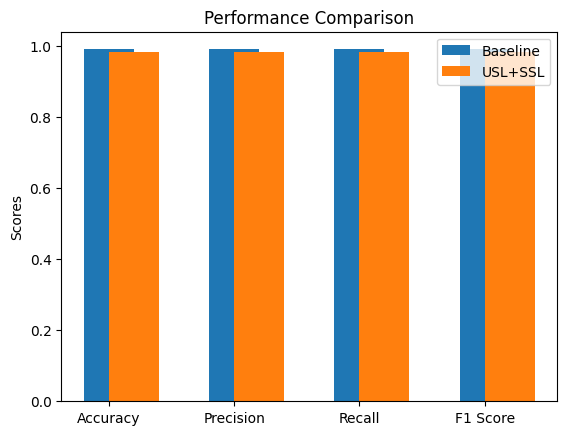

In [83]:

# Metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
baseline_values = [accuracy, precision, recall, f1]
usl_ssl_values = [accuracy_usl_ssl, precision_usl_ssl, recall_usl_ssl, f1_usl_ssl]

x = range(len(metrics))  # the label locations

fig, ax = plt.subplots()
ax.bar(x, baseline_values, width=0.4, label='Baseline', align='center')
ax.bar(x, usl_ssl_values, width=0.4, label='USL+SSL', align='edge')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

plt.show()


In [84]:
# Calculating percentages of baseline reached
percentage_of_baseline = {
    "Accuracy": (accuracy_usl_ssl / accuracy) * 100,
    "Precision": (precision_usl_ssl / precision) * 100,
    "Recall": (recall_usl_ssl / recall) * 100,
    "F1 Score": (f1_usl_ssl / f1) * 100
}

# Preparing data for DataFrame
data = {
    "Metric": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "Baseline": [accuracy, precision, recall, f1],
    "USL+SSL": [accuracy_usl_ssl, precision_usl_ssl, recall_usl_ssl, f1_usl_ssl],
    "Percentage of Baseline": [percentage_of_baseline["Accuracy"], percentage_of_baseline["Precision"], percentage_of_baseline["Recall"], percentage_of_baseline["F1 Score"]]
}

# Creating DataFrame
df = pd.DataFrame(data)

# Formatting for nicer display
df_formatted = df.copy()
df_formatted['Baseline'] = df_formatted['Baseline'].map('{:,.2f}%'.format)
df_formatted['USL+SSL'] = df_formatted['USL+SSL'].map('{:,.2f}%'.format)
df_formatted['Percentage of Baseline'] = df_formatted['Percentage of Baseline'].map('{:,.2f}%'.format)

# Display DataFrame
print(df_formatted)


df.to_html("comparison_report.html")


print("The comparison report has been saved to 'comparison_report-usl-t.html'.")

      Metric Baseline USL+SSL Percentage of Baseline
0   Accuracy    0.99%   0.98%                 99.37%
1  Precision    0.99%   0.98%                 99.37%
2     Recall    0.99%   0.98%                 99.37%
3   F1 Score    0.99%   0.98%                 99.37%
The comparison report has been saved to 'comparison_report.html'.
